In [1]:
import re
import pandas as pd
import random
import numpy as np
# координаты
from geopy.geocoders import Nominatim
# инструменты для шкалирования данных
from sklearn import preprocessing
# инструменты для оценки влияния на целевую переменную
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
# инструмент для создания и обучения модели
from sklearn.ensemble import RandomForestRegressor
# инструменты для оценки точности модели
from sklearn import metrics
# инструменты для разбивки датасета
from sklearn.model_selection import train_test_split
# визуализация
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import pylab
# инструменты для оценки полярности текста
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
%matplotlib inline
plt.style.use('default')

In [ ]:
pip freeze > requirements.txt

# 1. Введение
Одна из проблем компании Booking — это нечестные отели, которые накручивают себе  рейтинг. Одним из способов обнаружения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель ведёт себя нечестно, и его стоит проверить.

## 1.1 Постановка задачи
Набор данных представлен файлом формата csv. Необходимо построить модель предсказания пользовательской оценки.

## 1.2 Знакомство с датасетом
Первоначальная версия датасета содержит 17 полей со следующей информацией:
* hotel_address — адрес отеля;
* review_date — дата, когда рецензент разместил соответствующий отзыв;
* average_score — средний балл отеля, рассчитанный на основе последнего комментария за последний год;
* hotel_name — название отеля;
* reviewer_nationality — страна рецензента;
* negative_review — отрицательный отзыв, который рецензент дал отелю;
* review_total_negative_word_counts — общее количество слов в отрицательном отзыв;
* positive_review — положительный отзыв, который рецензент дал отелю;
* review_total_positive_word_counts — общее количество слов в положительном отзыве;
* reviewer_score — оценка, которую рецензент поставил отелю на основе своего опыта;
* total_number_of_reviews_reviewer_has_given — количество отзывов, которые рецензенты дали в прошлом;
* total_number_of_reviews — общее количество действительных отзывов об отеле;
* tags — теги, которые рецензент дал отелю;
* days_since_review — количество дней между датой проверки и датой очистки;
* additional_number_of_scoring — есть также некоторые гости, которые просто поставили оценку сервису, но не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.
* lat — географическая широта отеля;
* lng — географическая долгота отеля.

Взглянем  на него подробнее:

In [2]:
hotels_df = pd.read_csv('Data/hotels.csv')
hotels = hotels_df.copy()
print(hotels.info())
hotels.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643
3,216 Avenue Jean Jaures 19th arr 75019 Paris Fr...,34,9/22/2015,7.5,Mercure Paris 19 Philharmonie La Villette,United Kingdom,No Negative,0,607,Friendly staff quiet comfortable room spotles...,11,8,10.0,"[' Leisure trip ', ' Solo traveler ', ' Standa...",681 day,48.888697,2.394540
4,Molenwerf 1 1014 AG Amsterdam Netherlands,914,3/5/2016,8.5,Golden Tulip Amsterdam West,Poland,Torn sheets,4,7586,The staff was very friendly and helpful Break...,20,10,9.6,"[' Business trip ', ' Couple ', ' Standard Dou...",516 day,52.385601,4.847060


Итого данные представлены 3 типами:
* 4 колонки float64,
* 5 int64,
* 8 object(c последними предстоит что-то сделать, так как модель не будет работать с тестовыми данными).

Создадим список с числовыми признаками и будем обновлять его по ходу работы. Он пригодится нам на этапе шкалирования данных.

In [3]:
col_list = hotels.select_dtypes(exclude='object').columns.to_list()
col_list

['additional_number_of_scoring',
 'average_score',
 'review_total_negative_word_counts',
 'total_number_of_reviews',
 'review_total_positive_word_counts',
 'total_number_of_reviews_reviewer_has_given',
 'reviewer_score',
 'lat',
 'lng']

Из него смело можно исключить координаты, так как в нашем случае - это категориальные признаки.

In [4]:
for x in ['lat', 'lng']:
    del col_list[col_list.index(x)]
col_list

['additional_number_of_scoring',
 'average_score',
 'review_total_negative_word_counts',
 'total_number_of_reviews',
 'review_total_positive_word_counts',
 'total_number_of_reviews_reviewer_has_given',
 'reviewer_score']

# 2. Очистка данных

## 2.1 Дубликаты
### Поиск

In [5]:
if hotels.duplicated().any():
    print(f"Найдено "
          f"{hotels[hotels.duplicated() == True]['hotel_name'].count()}"
          f" дубликатов.")
else:
    print('Дубликатов не обнаружено.')

Найдено 307 дубликатов.


### Удаление
Так как удаление дубликатов приводит к снижению счёта на Kaggle, оставим всё как есть.

In [6]:
# hotels.drop_duplicates(inplace=True, ignore_index=True)

## 2.2 Обработка пропусков

### Поиск
Проверим на наличие пропусков

In [7]:
if hotels.isna().any().any():
    print('Есть пропущенные значения')
else:
    print('Пропусков не обнаружено')

Есть пропущенные значения


Рассмотрим подробнее.

In [8]:
mask = hotels.isna().mean().round(5) * 100
mask[mask > 0].rename('%')

lat    0.633
lng    0.633
Name: %, dtype: float64

### Замена
Составим список отелей с пропусками координат и посмотрим, что у них с адресами

In [9]:
temp = hotels[(hotels['lat'].isna()) | (hotels['lng'].isna())]\
    .groupby('hotel_name')[['lat', 'lng']].mean().index.tolist()
print(f'Список отелей с пропусками: \n{temp}')
name_and_address = hotels[hotels['hotel_name'].isin(temp)].groupby(
    ['hotel_name','hotel_address']
)['hotel_address'].count()
name_and_address

Список отелей с пропусками: 
['Austria Trend Hotel Schloss Wilhelminenberg Wien', 'City Hotel Deutschmeister', 'Cordial Theaterhotel Wien', 'Derag Livinghotel Kaiser Franz Joseph Vienna', 'Fleming s Selection Hotel Wien City', 'Holiday Inn Paris Montmartre', 'Hotel Advance', 'Hotel Atlanta', 'Hotel City Central', 'Hotel Daniel Vienna', 'Hotel Park Villa', 'Hotel Pension Baron am Schottentor', 'Maison Albar Hotel Paris Op ra Diamond', 'Mercure Paris Gare Montparnasse', 'NH Collection Barcelona Podium', 'Renaissance Barcelona Hotel', 'Roomz Vienna']


hotel_name                                        hotel_address                                              
Austria Trend Hotel Schloss Wilhelminenberg Wien  Savoyenstra e 2 16 Ottakring 1160 Vienna Austria               141
City Hotel Deutschmeister                         Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria             63
Cordial Theaterhotel Wien                         Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria        40
Derag Livinghotel Kaiser Franz Joseph Vienna      Sieveringer Stra e 4 19 D bling 1190 Vienna Austria            112
Fleming s Selection Hotel Wien City               Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria    496
Holiday Inn Paris Montmartre                      23 Rue Damr mont 18th arr 75018 Paris France                    47
Hotel Advance                                     Sep lveda 180 Eixample 08011 Barcelona Spain                    26
Hotel Atlanta                                     W hringer Stra e 33 3

Адреса не дублируются т.е. халявы не будет и придётся находить все 17 координат. Попутно выяснилось:
- в именах отеля могут быть ошибки: "Fleming __s__ Selection Hotel Wien City", "Maison Albar Hotel Paris __Op ra__ Diamond" на самом деле это - "__Flemings__ Selection Hotel Wien City" и "Maison Albar Hotel Paris __Opera__ Diamond"(ныне "Maison Albar Hotels Le Diamond")!
- похоже, что все адреса у отелей без координат содержат ошибку.

И так составим план ближайших действий:
1) заполним правильные адреса,
2) найдём по полученным адресам координаты.

PS выяснилось что в пропущенных символах в адресах оказалась виновата кодировка(внезапно!).

Изначально адреса парсились, но потом гугл, а вслед за ним и дакдак перестали отвечать на запросы (забанили наверно :D). По итогу представлен вариант замены классической школы `ctrl+C -> ctrl+V`.


In [10]:
new_address = {
    'Austria Trend Hotel Schloss Wilhelminenberg Wien':
        'Savoyenstraße 2, 16. Ottakring, 1160 Vienna, Austria',
    'City Hotel Deutschmeister':
        'Grünentorgasse 30, 09. Alsergrund, 1090 Vienna, Austria',
    'Cordial Theaterhotel Wien':
        'Josefstädter Straße 22, 08. Josefstadt, 1080 Vienna, Austria',
    'Derag Livinghotel Kaiser Franz Joseph Vienna':
        'Sieveringer Straße 4, 19. Döbling, 1190 Vienna, Austria',
    'Fleming s Selection Hotel Wien City':
        'Josefstädter Straße 10-12, 08. Josefstadt, 1080 Vienna, Austria',
    'Holiday Inn Paris Montmartre':
        '23 Rue Damrémont, 18th arr., 75018 Paris, France',
    'Hotel Advance':
        'Sepúlveda, 180, Eixample, 08011 Barcelona, Spain',
    'Hotel Atlanta':
        'Währinger Straße 33-35, 09. Alsergrund, 1090 Vienna, Austria',
    'Hotel City Central':
        'Taborstraße 8 A, 02. Leopoldstadt, 1020 Vienna, Austria',
    'Hotel Daniel Vienna':
        'Landstraßer Gürtel 5, 03. Landstraße, 1030 Vienna, Austria',
    'Hotel Park Villa':
        'Hasenauerstraße 12, 19. Döbling, 1190 Vienna, Austria',
    'Hotel Pension Baron am Schottentor':
        'Währinger Straße 12, 09. Alsergrund, 1090 Vienna, Austria',
    'Maison Albar Hotel Paris Op ra Diamond':
        '4 rue de la Pépinière, 8th arr., 75008 Paris, France',
    'Mercure Paris Gare Montparnasse':
        '20 Rue De La Gaîté, 14th arr., 75014 Paris, France',
    'NH Collection Barcelona Podium':
        'Bailén, 4-6, Eixample, 08010 Barcelona, Spain',
    'Renaissance Barcelona Hotel':
        'Pau Clarís, 122, Eixample, 08009 Barcelona, Spain',
    'Roomz Vienna':
        'Paragonstraße 1, 11. Simmering, 1110 Vienna, Austria'
}

geolocator = Nominatim(user_agent="Zelfreg")
for hotel in new_address.keys():
    # адрес
    hotels.loc[hotels['hotel_name'] == hotel, 'hotel_address'] = \
        new_address[hotel]
    # координаты
    # так как OpenStreetMap не всегда может обработать адрес, содержащий
    # район будем использовать try-except
    location = geolocator.geocode(new_address[hotel])
    try:
        hotels.loc[hotels['hotel_name'] == hotel, 'lat'] = location.latitude
        hotels.loc[hotels['hotel_name'] == hotel, 'lng'] = location.longitude
    except AttributeError:
        # избавляемся от района
        partitions = new_address[hotel].split(',')
        del partitions[1]
        location = geolocator.geocode(','.join(partitions))
        # возможно будут где-то ещё ошибки
        try:
            hotels.loc[hotels['hotel_name'] == hotel, 'lat'] = \
                round(location.latitude, 6)
            hotels.loc[hotels['hotel_name'] == hotel, 'lng'] = \
                round(location.longitude, 6)
        except AttributeError:
            print(f'Внимание необработанный адрес!!!\n{new_address[hotel]}'
                  f'\nОтель: {hotel}')

Проверим ещё раз на наличие пропусков:

In [11]:
if hotels.isna().any().any():
    print('Есть пропущенные значения')
else:
    print('Пропусков не обнаружено')

Пропусков не обнаружено


А теперь проверим сколько у нас уникальных координат:

In [12]:
print(f"Уникальных значений широты: {hotels['lat'].nunique()}.")
print(f"Уникальных значений долготы: {hotels['lng'].nunique()}.")

Уникальных значений широты: 1489.
Уникальных значений долготы: 1489.


Забегая на перёд, уникальных адресов у нас: 1493. Следовательно, некоторые из lat, lng должны иметь больше одного адреса.

In [13]:
lat = hotels.groupby('lat')['hotel_address'].nunique()
display(lat[lat != 1])
lng = hotels.groupby('lng')['hotel_address'].nunique()
display(lng[lng != 1])

lat
45.485888    2
45.488764    2
51.498147    2
51.511945    2
Name: hotel_address, dtype: int64

lng
-0.179939    2
-0.143649    2
 9.183057    2
 9.204283    2
Name: hotel_address, dtype: int64

Теперь проверим есть ли адреса с несколькими координатами.

In [14]:
address = hotels.groupby('hotel_address')['lat'].nunique()
display(address[address != 1])
address = hotels.groupby('hotel_address')['lng'].nunique()
display(address[address != 1])

Series([], Name: lat, dtype: int64)

Series([], Name: lng, dtype: int64)

Таковых не найдено. Поэтому для восстановления координат воспользуемся геолокатором. Для этого установим сомнительные адреса, а заодно и название отелей. Начнём с широты:

In [15]:
lat = hotels[hotels['lat'].isin(lat[lat != 1].index)]\
    .groupby(['lat', 'hotel_address', 'hotel_name'])['positive_review'].count()
lat

lat        hotel_address                                                                 hotel_name                         
45.485888  Corso Buenos Aires 42 5 Central Station 20124 Milan Italy                     Best Western Hotel City                128
           Via G B Pirelli 7 Central Station 20124 Milan Italy                           Hotel Auriga                           196
45.488764  6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy               Hotel VIU Milan                         45
           Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan Italy        Holiday Inn Milan Garibaldi Station     33
51.498147  39 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom  Rubens At The Palace                   569
           41 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom  41                                      77
51.511945  Lancaster Gate Westminster Borough London W2 3LG United Kingdom         

Адреса получены, продолжим.

In [16]:
# извлечём адреса из мульти-индекса
temp = [m_i[1] for m_i in lat.index]
# словарь для замены широты
lat_new = {}
for address in temp:
    try:
        lat[address] = geolocator.geocode(address).latitude
    except Exception:
        print(f'Широта не найдена для:\n{address}', '\n','-'*80)

Широта не найдена для:
Corso Buenos Aires 42 5 Central Station 20124 Milan Italy 
 --------------------------------------------------------------------------------
Широта не найдена для:
Via G B Pirelli 7 Central Station 20124 Milan Italy 
 --------------------------------------------------------------------------------
Широта не найдена для:
6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy 
 --------------------------------------------------------------------------------
Широта не найдена для:
Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan Italy 
 --------------------------------------------------------------------------------
Широта не найдена для:
39 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom 
 --------------------------------------------------------------------------------
Широта не найдена для:
41 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom 
 ----------------------------------------------

Восемь из восьми...

Теперь для долготы:

In [17]:
lng = hotels[hotels['lng'].isin(lng[lng != 1].index)]\
    .groupby(['lng', 'hotel_address', 'hotel_name'])['positive_review'].count()
display(lng)
print('\n')
# извлечём адреса из мульти-индекса
temp = [m_i[1] for m_i in lng.index]
# словарь для замены долготы
lng_new = {}
for address in temp:
    try:
        lng[address] = geolocator.geocode(address).latitude
    except Exception:
        print(f'Долгота не найдена для:\n{address}', '\n','-'*80)

lng        hotel_address                                                                 hotel_name                         
-0.179939  Lancaster Gate Westminster Borough London W2 3LG United Kingdom               Corus Hotel Hyde Park                  821
           Lancaster Terrace Westminster Borough London W2 2TY United Kingdom            Lancaster London                       509
-0.143649  39 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom  Rubens At The Palace                   569
           41 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom  41                                      77
 9.183057  6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy               Hotel VIU Milan                         45
           Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan Italy        Holiday Inn Milan Garibaldi Station     33
 9.204283  Corso Buenos Aires 42 5 Central Station 20124 Milan Italy               



Долгота не найдена для:
Lancaster Gate Westminster Borough London W2 3LG United Kingdom 
 --------------------------------------------------------------------------------
Долгота не найдена для:
Lancaster Terrace Westminster Borough London W2 2TY United Kingdom 
 --------------------------------------------------------------------------------
Долгота не найдена для:
39 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom 
 --------------------------------------------------------------------------------
Долгота не найдена для:
41 Buckingham Palace Road Westminster Borough London SW1W 0PS United Kingdom 
 --------------------------------------------------------------------------------
Долгота не найдена для:
6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy 
 --------------------------------------------------------------------------------
Долгота не найдена для:
Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan Italy 
 -----------------

БИНГО! :-/

И так как с парсингом увы всё. Переходим на "вырезать-вставить".

In [18]:
lat_new = {
    0: 'lat',
    'Corso Buenos Aires 42 5 Central Station 20124 Milan Italy':
        45.479270,
    'Via G B Pirelli 7 Central Station 20124 Milan Italy ':
        45.484095,
    '6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy':
        45.483188,
    'Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan '
    'Italy': 45.488993,
    '39 Buckingham Palace Road Westminster Borough London SW1W 0PS United '
    'Kingdom': 51.498565,
    '41 Buckingham Palace Road Westminster Borough London SW1W 0PS United '
    'Kingdom': 51.498376,
    'Lancaster Gate Westminster Borough London W2 3LG United Kingdom':
        51.511966,
    'Lancaster Terrace Westminster Borough London W2 2TY United Kingdom':
        51.512650
}
lng_new = {
    0: 'lng',
    'Lancaster Gate Westminster Borough London W2 3LG United Kingdom':
        -0.177711,
    'Lancaster Terrace Westminster Borough London W2 2TY United Kingdom':
        -0.175749,
    '39 Buckingham Palace Road Westminster Borough London SW1W 0PS United '
    'Kingdom': -0.143393,
    '41 Buckingham Palace Road Westminster Borough London SW1W 0PS United '
    'Kingdom': -0.143497,
    '6 Via Aristotile Fioravanti Garibaldi Station 20154 Milan Italy':
        9.177583,
    'Via Ugo Bassi 1 A Ang Via C Farini Garibaldi Station 20159 Milan Italy':
        9.183134,
    'Corso Buenos Aires 42 5 Central Station 20124 Milan Italy':
        9.210140,
    'Via G B Pirelli 7 Central Station 20124 Milan Italy':
        9.200881
}
for x in [lat_new, lng_new]:
    for address in x:
        hotels.loc[hotels['hotel_address'] == address, x[0]] =\
            x[address]
hotels['lat'] = hotels['lat'].astype('float64')
hotels['lng'] = hotels['lng'].astype('float64')

In [19]:
# ещё раз проверим на совпадение
lat = hotels.groupby('lat')['hotel_address'].nunique()
if lat[lat != 1].empty:
    print('Записей с одинаковой широтой не найдено.')
else:
    print('Найдены записи с одинаковой широтой.')
lng = hotels.groupby('lng')['hotel_address'].nunique()
if lat[lat != 1].empty:
    print('Записей с одинаковой долготой не найдено.')
else:
    print('Найдены записи с одинаковой долготой.')

Записей с одинаковой широтой не найдено.
Записей с одинаковой долготой не найдено.


## 2.3 Выбросы
Рассмотрим внимательнее наши числовые признаки. А именно сейчас нас будет интересовать их распределение.

Text(0.5, 1.0, 'Выбросы числовых признаков')

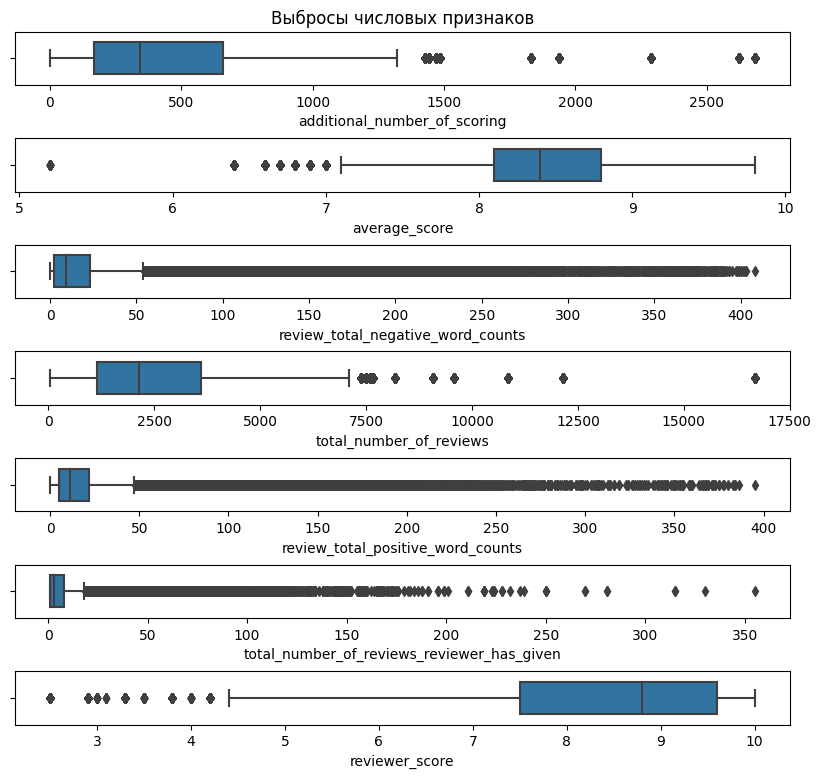

In [20]:
temp = hotels[col_list].columns.to_list()
fig, axes = plt.subplots(figsize=(10, 9), nrows=len(temp), ncols=1)
for col in temp:
    sns.boxplot(
        data=hotels,
        x=col,
        ax=axes[temp.index(col)],
        width=0.6
    )
fig.subplots_adjust(hspace=1)
axes[0].set_title('Выбросы числовых признаков')

Выбросы есть в каждом столбце, но не от всех из них мы можем избавиться по причине описанной ниже.

Оценим количество уникальных значений в числовых признаках.

In [21]:
hotels[temp].nunique()

additional_number_of_scoring                   480
average_score                                   34
review_total_negative_word_counts              402
total_number_of_reviews                       1142
review_total_positive_word_counts              354
total_number_of_reviews_reviewer_has_given     194
reviewer_score                                  37
dtype: int64

Вариативность их меньше чем количество уникальных отелей.

А теперь возьмём случайный отель и получим число уникальных значений по каждому из числовых признаков.

In [22]:
# фиксируем начальное значение для воспроизводимости результата
random.seed(42)
# выберем случайный отель
rand_hotel = random.choice(hotels['hotel_name'].unique())
hotels[hotels['hotel_name'] == rand_hotel][temp].nunique()

additional_number_of_scoring                   1
average_score                                  1
review_total_negative_word_counts             41
total_number_of_reviews                        1
review_total_positive_word_counts             50
total_number_of_reviews_reviewer_has_given    25
reviewer_score                                14
dtype: int64

Вывод:
 у отелей есть такие характеристики(additional_number_of_scoring, average_score, total_number_of_reviews) отфильтровав которые(очистив выбросы), мы удалим этот отель в целом!

Таким образом признаки additional_number_of_scoring, average_score, total_number_of_reviews пока оставим как есть и займёмся оставшейся четвёркой.
Напомним ещё раз их значения:
1) review_total_negative_word_counts - к-во слов в негативной части;
2) review_total_positive_word_counts - к-во слов в позитивной части;
3) reviewer_score - общая оценка оставленная пользователем;
4) total_number_of_reviews_reviewer_has_given - общее к-во оценок проставленных пользователем.

### total_number_of_reviews_reviewer_has_given

In [23]:
# описательные cтатистики
hotels['total_number_of_reviews_reviewer_has_given'].describe()

count    386803.00000
mean          7.17725
std          11.05442
min           1.00000
25%           1.00000
50%           3.00000
75%           8.00000
max         355.00000
Name: total_number_of_reviews_reviewer_has_given, dtype: float64

Воспользуемся методом Тьюке, и так как $q25 = min$, будем исследовать только верхнюю границу $upper fence=q75+x*iqr$. Где $iqr=q75-q25$, а $x$ - шаг  установим в 1.5. Просчитав весь спектр моделей получим следующий график:

In [24]:
temp = {0: 12.495, 1.5: 12.629, 3.0: 12.547, 4.5: 12.642, 6.0: 12.553,
        7.5: 12.517, 9.0: 12.542, 10.5: 12.507, 12.0: 12.523, 13.5: 12.509,
        15.0: 12.606, 16.5: 12.467, 18.0: 12.577, 19.5: 12.621, 21.0: 12.462,
        22.5: 12.563, 24.0: 12.506, 25.5: 12.547, 27.0: 12.455, 28.5: 12.437,
        30.0: 12.494, 31.5: 12.417, 33.0: 12.436, 34.5: 12.418, 36.0: 12.392,
        37.5: 12.488, 39.0: 12.488, 40.5: 12.498, 42.0: 12.498, 43.5: 12.498,
        45.0: 12.468, 46.5: 12.459, 48.0: 12.459, 49.5: 12.459, 51: 12.495}
fig = px.line(
    y=temp.values(),
    x=temp.keys(),
    title='Зависимость MAPE от ширины размаха(iqr)'
).add_hline(y=12.493, annotation_text='Без очистки - 12.495', line_width=1.2)
fig.update_xaxes(title='ширина размаха, iqr')
fig.update_yaxes(title='MAPE, %')

Таким образом получили минимальное значение погрешности при $x = 36$

In [25]:
q_25, q_75 = hotels['total_number_of_reviews_reviewer_has_given'].quantile(
    [0.25, 0.75]
)
upper = q_75 + 36*(q_75 - q_25)
hotels = hotels[hotels['total_number_of_reviews_reviewer_has_given']
                       < upper]

### reviewer_score
Имеем не большое количество выбросов принадлежащих интервалу [min, q25-1.5iqr], поэтому просто удалим всё что меньше 1.5iqr

In [26]:
q_25, q_75 = hotels['reviewer_score'].quantile([0.25, 0.75])
fence = q_25 - 1.5*(q_75 - q_25)
outliers_amount = hotels[hotels['reviewer_score'] < fence]['reviewer_score']\
    .count()
print(f'Количество выбросов принадлежащих интервалу [min, q25]: {outliers_amount}')
hotels = hotels[hotels['reviewer_score'] > fence]

Количество выбросов принадлежащих интервалу [min, q25]: 11908


### review_total_positive_word_counts
Построим спектр моделей аналогично с total_number_of_reviews_reviewer_has_given.

In [27]:
temp = {0: 10.506, 1.5: 10.79, 3.0: 10.578, 4.5: 10.558, 6.0: 10.478,
        7.5: 10.502, 9.0: 10.497, 10.5: 10.485, 12.0: 10.49, 13.5: 10.506,
        15.0: 10.496, 16.5: 10.555, 18.0: 10.545, 19.5: 10.488, 21.0: 10.528,
        22.5: 10.506}
fig = px.line(
    y=temp.values(),
    x=temp.keys(),
    title='Зависимость MAPE от ширины размаха(iqr)'
).add_hline(y=10.504, annotation_text='Без очистки - 10,504', line_width=1.2)
fig.update_xaxes(title='ширина размаха, iqr')
fig.update_yaxes(title='MAPE, %')

За исключением просадки на ~0.3% при классической ширине размаха в 1.5iqr, изменением MAPE можно принебречь - сохраним больше данных.

### review_total_negative_word_counts

In [28]:
temp = {0: 10.506, 1.5: 10.161, 3.0: 10.42, 4.5: 10.494, 6.0: 10.483,
        7.5: 10.458, 9.0: 10.526, 10.5: 10.53, 12.0: 10.524, 13.5: 10.556,
        15.0: 10.556, 16.5: 10.523, 18.0: 10.546, 19.5: 10.494, 21: 10.506}
fig = px.line(
    y=temp.values(),
    x=temp.keys(),
    title='Зависимость MAPE от ширины размаха(iqr)'
).add_hline(y=10.504, annotation_text='Без очистки - 10,504', line_width=1.2)
fig.update_xaxes(title='ширина размаха, iqr')
fig.update_yaxes(title='MAPE, %')

Минимальное значение погрешности при $x = 1.5$

In [29]:
q_25, q_75 = hotels['review_total_negative_word_counts'].quantile(
    [0.25, 0.75]
)
fence = q_75 + 1.5*(q_75 - q_25)
hotels = hotels[hotels['review_total_negative_word_counts'] < fence]

# 3. Преобразование признаков
Переведём данные из строкового типа к численному.

## hotel_name и hotel_address
Для правильной идентификации отеля нам нужен некий параметр, который будет уникален для каждого отеля. Возможно это название, а возможно и адрес.

Сравним количество уникальных адресов:

In [30]:
print(f"Количество уникальных отелей: {hotels['hotel_name'].nunique()}\n")
print(f"Количество уникальных адресов отелей: "
      f"{hotels['hotel_address'].nunique()}")

Количество уникальных отелей: 1492

Количество уникальных адресов отелей: 1493


Таким образом один отель имеет два различных адреса. Попробуем найти его:

In [31]:
temp = hotels.groupby('hotel_name')['hotel_address'].nunique()
temp[temp != 1]

hotel_name
Hotel Regina    3
Name: hotel_address, dtype: int64

Хм... А подробнее?

In [32]:
hotels[hotels['hotel_name'] == 'Hotel Regina'].groupby(['hotel_name', 'hotel_address'])\
    ['hotel_address'].count().rename('review_count')

hotel_name    hotel_address                                             
Hotel Regina  Bergara 2 4 Eixample 08002 Barcelona Spain                    416
              Rooseveltplatz 15 09 Alsergrund 1090 Vienna Austria           205
              Via Cesare Correnti 13 Milan City Center 20123 Milan Italy     47
Name: review_count, dtype: int64

Судя по всему - это сеть отелей в разных городах под одним названием. Но теперь по одному адресу должно находиться ДВА отеля!

In [33]:
temp = hotels.groupby('hotel_address')['hotel_name'].nunique()
for weird_address in temp[temp != 1].index:
    print(f'По адресу "{weird_address}" находятся:')
    name_list = hotels[hotels['hotel_address'] == weird_address].groupby\
    ('hotel_name')['hotel_name'].count().index.to_list()
    for name in name_list:
        print(name)
    print('-'*80)

По адресу "8 Northumberland Avenue Westminster Borough London WC2N 5BY United Kingdom" находятся:
Club Quarters Hotel Trafalgar Square
The Grand at Trafalgar Square
--------------------------------------------------------------------------------


Таким образом заменить идентификатор отеля ни именем ни адресом не получится... Объединим их и заменим на числовой эквивалент! Из адреса извлечём город и страну.

In [34]:
hotels['hotel_id'] = hotels['hotel_address'] + '~~~' + hotels['hotel_name']
hotels['hotel_id'] = hotels['hotel_id'].astype('category')
hotel_id_list = hotels['hotel_id'].unique().tolist()
hotel_id_cat = {x: hotel_id_list.index(x) for x in hotel_id_list}
hotels['hotel_id'] = hotels['hotel_id'].cat.rename_categories(hotel_id_cat)
# hotel_name можно спокойно удалить, а hotel_address пока оставим
hotels.drop(columns='hotel_name', inplace=True)

## reviewer_nationality
Представим в виде численного категориального признака.

In [35]:
nationality_id_list = hotels['reviewer_nationality'].unique().tolist()
hotels['reviewer_nationality'] = hotels['reviewer_nationality']\
    .astype('category')
nationality_id_cat = {
    x: nationality_id_list.index(x) for x in nationality_id_list
}
hotels['reviewer_nationality'] = hotels['reviewer_nationality'].cat\
    .rename_categories(nationality_id_cat)

PS не все национальностью указаны в соответствии с международным территориальным делением и официальны названием стран. Так были обнаружены граждане государства Крым, Косово, Палестины. Решил оставить как есть ибо гражданство нас будет интересовать с точки зрения отражения социального статуса(а значит и наличия денежных средств) контингента.

## days_since_review
Приведём к численному формату

In [36]:
hotels['days_since_review'] = hotels['days_since_review'].apply(
    lambda x: int(x.partition(' ')[0])
)

## rev_date
Извлечём `year`, `month`, `day_of_weak` из `rev_date`

In [37]:
hotels['review_date'] = pd.to_datetime(hotels['review_date'])
hotels['month'] = hotels['review_date'].dt.month
hotels['year'] = hotels['review_date'].dt.year
hotels['dayofweek'] = hotels['review_date'].dt.dayofweek
hotels.drop(columns='review_date', inplace=True)

## tags
Теперь нужно что-то сделать с тегами...

In [38]:
# распакуем строки в списки
hotels['tags'] = hotels_df['tags'].apply(
    lambda x: re.findall("((?<='[A-Z ])[^']+) ", x)
)
# подсчитаем кл-во каждого тега
all_tags = set([y for x in hotels['tags'] for y in x])
tags_count = {x: 1 for x in all_tags}
for tag in tags_count.keys():
    for row in hotels['tags']:
        if tag in row:
            tags_count[tag] += 1
# оценим визуально разнообразие тегов
tags_count = pd.Series(tags_count).sort_values(ascending=False)
px.histogram(
    x=tags_count.index,
    y=tags_count,
    title='Дискретная сумма по тегам',
    height=1000
).update_yaxes(
    title='к-во тегов'
).update_xaxes(
    title='теги'
)

Как видно из гистограммы есть популярные теги, есть не очень, а есть и очень редкие. Сделаем следующее: возьмём первых `n = 30` тегов по популярности и закодируем их используя бинарный принцип.

In [39]:
n = 30
tag_list = tags_count.index.tolist()[:n]
# создадим пустые колонки
for col in tag_list:
    hotels[col] = 0
for i in hotels.index:
    for tag in hotels.loc[i, 'tags']:
        if tag in tag_list:
            hotels.loc[i, tag] = 1

# 4. Создание новых признаков

## Тональность оставленных отзывов.
Было найдено 4 библиотеки с готовыми моделями для оценки тональности текста:
1) NLTK(рекомендованный на платформе);
2) TextBlob - но Kaggle его не устанавливает;
3) CoreNLP - для работы с ним требуется запуск сервера, что опять же невозможно в рамках Kaggle;
4) Flair - показывает самые высокие результаты, но ОЧЕНЬ ресурсоёмок(привет, Kaggle).

Поэтому будем пользоваться первым. NLTK `SentimentIntensityAnalyzer` вернёт 4 значения:
* neg - доля отрицательного оттенка;
* neu - нейтральная;
* pos - положительная часть;
* compound - общая оценка.

По идее нам должно хватить и `compound`, но для эксперимента добавим все.

In [40]:
def git_gut(df: pd.DataFrame, target: str) -> pd.DataFrame:
    """
    Принимает датафрейм и целевой признак. Создаёт 4 дополнительных признака
    'neg', 'neu', 'pos', 'compound'. Заполняет их на основании проведённой
    оценки тональности библиотекой NTLK.
    :param df: исходный датафрейм.
    :param target: название столбца данным которого будет давать оценку
    тональности.
    :return: исходный датафрейм + четыре новых признака
    """
    indx = df.shape[0]
    sent_analyzer = SentimentIntensityAnalyzer()
    new_column_list = []
    # создадим новые признаки заранее
    for val in ['neg', 'neu', 'pos', 'compound']:
        new_column_name = target[:1] + '_' +val
        new_column_list.append(new_column_name)
        df[new_column_name] = 0
    # пройдёмся по всем записям
    for i in range(indx):
        sample = df.loc[i, target]
        # оценка тональности признака
        vals = list(sent_analyzer.polarity_scores(sample).items())
        # распределение результата по соответствующим колонкам
        for column in new_column_list:
            df.loc[i, column] = vals.pop(0)[1]
    return df

In [41]:
hotels.reset_index(inplace=True, drop=True)
nltk.downloader.download('vader_lexicon')
git_gut(hotels, 'positive_review')
git_gut(hotels, 'negative_review')
hotels.drop(columns=['negative_review', 'positive_review'], inplace=True)
# обновим список колонок
col_list.extend(['p_neg', 'p_neu', 'p_pos','p_compound', 'n_neg', 'n_neu',
                 'n_pos', 'n_compound'])
hotels.head()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\gosta\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


,hotel_address,additional_number_of_scoring,average_score,reviewer_nationality,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,...,Executive Double Room,Superior Twin Room,p_neg,p_neu,p_pos,p_compound,n_neg,n_neu,n_pos,n_compound
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,0,3,1994,4,7,10.0,"[Leisure trip, Couple, Studio Suite, Stayed 2 ...",...,0,0,0.000,0.345,0.655,0.5859,0.000,1.000,0.0,0.0000
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,0,3,1361,2,14,6.3,"[Business trip, Couple, Standard Double Room, ...",...,0,0,0.000,1.000,0.000,0.0000,0.756,0.244,0.0,-0.4767
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,1,6,406,0,14,7.5,"[Leisure trip, Solo traveler, Modern Double Ro...",...,0,0,0.379,0.000,0.621,0.3400,0.423,0.577,0.0,-0.2960
3,216 Avenue Jean Jaures 19th arr 75019 Paris Fr...,34,7.5,0,0,607,11,8,10.0,"[Leisure trip, Solo traveler, Standard Room wi...",...,0,0,0.000,0.279,0.721,0.9169,1.000,0.000,0.0,-0.7096
4,Molenwerf 1 1014 AG Amsterdam Netherlands,914,8.5,2,4,7586,20,10,9.6,"[Business trip, Couple, Standard Double or Twi...",...,0,0,0.000,0.618,0.382,0.8503,0.667,0.333,0.0,-0.2500


## city и country
Извлечём название города и страны из признака hotel_address. Из-за того что адреса битые, а парсинг закрыт, получить название района не представляется возможным.

In [42]:
hotels['country'] = 0
hotels['city'] = 0
for i in range(hotels.shape[0]):
    splitted_adress = hotels.loc[i, 'hotel_address'].split(' ')
    # страна
    if splitted_adress[-1] == 'Kingdom':
        country = ' '.join(splitted_adress[-2:])
    else:
        country = ' '.join(splitted_adress[-1:])

    # город
    if splitted_adress[-1] == 'Kingdom':
        city = ' '.join(splitted_adress[-5:-4]).replace(',', '')
    else:
        city = ' '.join(splitted_adress[-2:-1]).replace(',', '')

    hotels.loc[i, 'country'] = country
    hotels.loc[i, 'city'] = city
# посмотрим, что получилось
display(hotels['country'].unique())
display(hotels['city'].unique())

array(['United Kingdom', 'France', 'Netherlands', 'Italy', 'Austria',
       'Spain'], dtype=object)

array(['London', 'Paris', 'Amsterdam', 'Milan', 'Vienna', 'Barcelona'],
      dtype=object)

Похоже на правду. Теперь от адреса можно избавляться. А полученные признаки перевести в численное представление.

In [43]:
hotels.drop(columns='hotel_address', inplace=True)
# создадим словари для кодирования
temp = hotels['country'].unique().tolist()
country_cat = {x: temp.index(x) for x in temp}
temp = hotels['city'].unique().tolist()
city_cat = {x: temp.index(x) for x in temp}
# кодирование
hotels['country'] = hotels['country'].astype('category')
hotels['country'] = hotels['country'].cat.rename_categories(country_cat)
hotels['city'] = hotels['city'].astype('category')
hotels['city'] = hotels['city'].cat.rename_categories(city_cat)

# 5. Шкалирование данных
Перед выбором методов оценим визуально распределение численных(не номинальных) признаков.

Text(0.5, 0.98, 'Распределение до шкалирования')

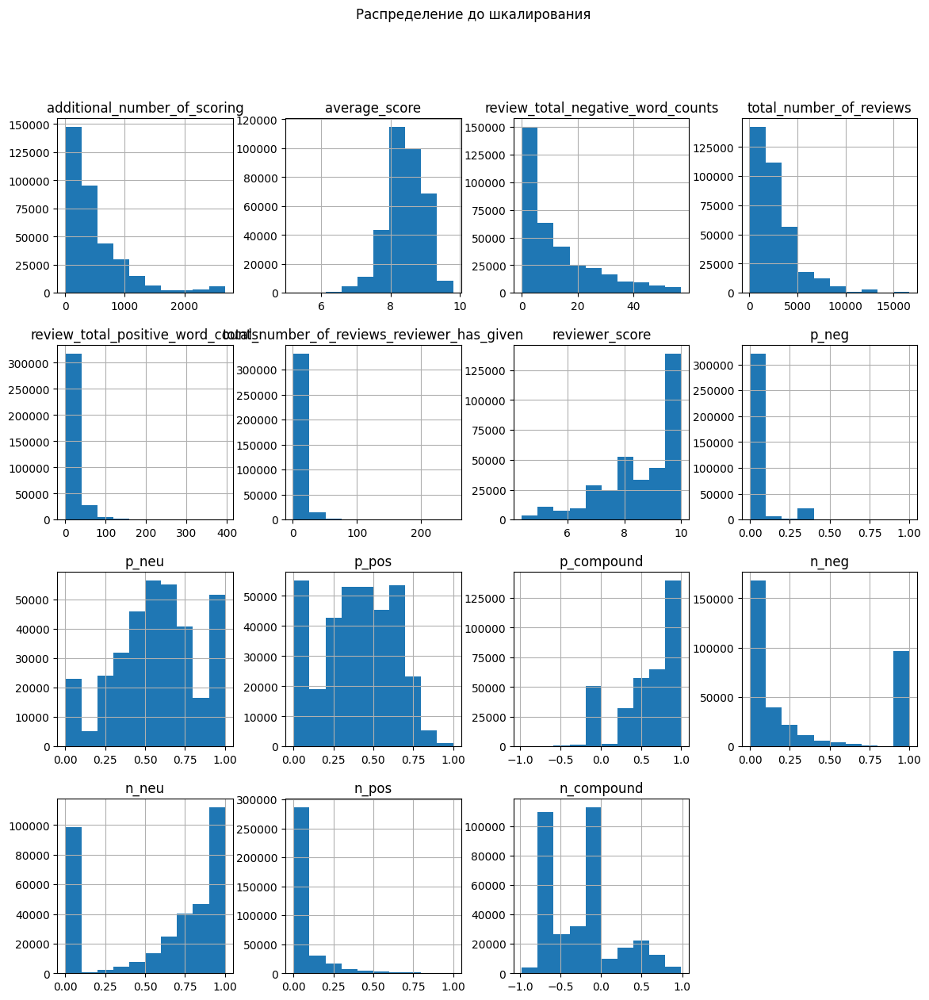

In [44]:
hotels_scaled = hotels.copy()
hotels[col_list].hist(figsize=(14, 14))
pylab.suptitle('Распределение до шкалирования')

In [45]:
# и немного стат. информации
hotels[col_list].describe()

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,p_neg,p_neu,p_pos,p_compound,n_neg,n_neu,n_pos,n_compound
count,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000,351485.000000
mean,493.825668,8.419685,12.193106,2720.244801,17.396722,7.214888,8.640717,0.030933,0.574569,0.393978,0.603198,0.343195,0.598975,0.051938,-0.215016
std,494.020348,0.537102,13.589538,2292.658447,20.540679,11.039762,1.355440,0.097120,0.269102,0.234920,0.335805,0.422566,0.404286,0.119799,0.436108
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.000000,4.400000,0.000000,0.000000,0.000000,-0.983200,0.000000,0.000000,0.000000,-0.981300
25%,168.000000,8.100000,0.000000,1148.000000,6.000000,1.000000,7.900000,0.000000,0.408000,0.238000,0.401900,0.000000,0.000000,0.000000,-0.709600
50%,338.000000,8.500000,8.000000,2116.000000,11.000000,3.000000,9.200000,0.000000,0.580000,0.411000,0.718400,0.116000,0.761000,0.000000,-0.165500
75%,641.000000,8.800000,19.000000,3611.000000,22.000000,8.000000,9.600000,0.000000,0.745000,0.591000,0.884900,1.000000,1.000000,0.000000,0.000000
max,2682.000000,9.800000,57.000000,16670.000000,395.000000,250.000000,10.000000,1.000000,1.000000,1.000000,0.999300,1.000000,1.000000,1.000000,0.989100


Шкалировать будем признаки с большим разбросом значений:
* review_total_negative_word_counts,
* review_total_positive_word_counts,
* total_number_of_reviews_reviewer_has_given.

А тех, у кого не удалось избавиться от выбросов переведём в категориальную когорту:
* additional_number_of_scoring
* total_number_of_reviews

### review_total_negative_word_counts
Ещё раз обратимся к распределению и заодно проведём логарифмирование.

Text(0.5, 1.0, 'Визуальная оценка')

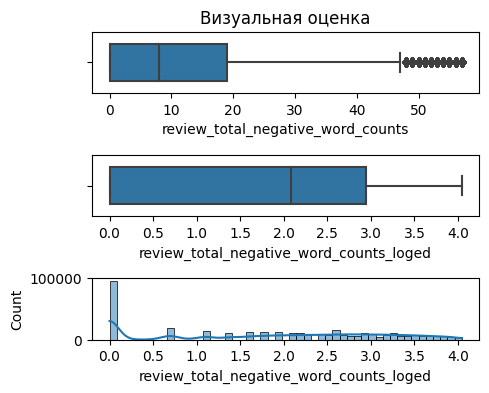

In [46]:
fig, axes = plt.subplots(figsize=(5,4), nrows=3, ncols=1)
sns.boxplot(
    data=hotels,
    x='review_total_negative_word_counts',
    ax=axes[0],
    width=0.6
)
loged = pd.DataFrame(
    hotels['review_total_negative_word_counts'].apply(
        lambda x: np.log(x) if x!=0 else np.log(x+1)
    )
)
loged.columns = ['review_total_negative_word_counts_loged']
sns.boxplot(
    data=loged,
    x='review_total_negative_word_counts_loged',
    ax=axes[1],
    width=0.6
)
sns.histplot(
    data=loged,
    x='review_total_negative_word_counts_loged',
    ax=axes[2],
    kde=True
)
fig.subplots_adjust(hspace=1)
axes[0].set_title('Визуальная оценка')

Окончательно избавились от выбросов, но распределение всё еще не нормальное - нормализируем через минмаксер.

In [47]:
mm_scaler = preprocessing.MinMaxScaler()
hotels_scaled['review_total_negative_word_counts'] = \
    mm_scaler.fit_transform(loged)

## review_total_positive_word_counts
Ещё раз обратимся к распределению и заодно проведём логарифмирование.

Text(0.5, 1.0, 'Визуальная оценка')

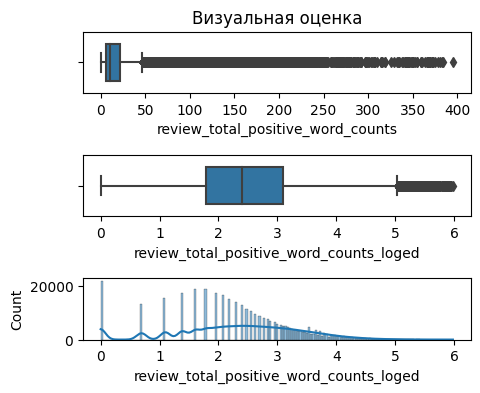

In [48]:
fig, axes = plt.subplots(figsize=(5,4), nrows=3, ncols=1)
sns.boxplot(
    data=hotels,
    x='review_total_positive_word_counts',
    ax=axes[0],
    width=0.6
)
loged = pd.DataFrame(
    hotels['review_total_positive_word_counts'].apply(
        lambda x: np.log(x) if x!=0 else np.log(x+1)
    )
)
loged.columns = ['review_total_positive_word_counts_loged']
sns.boxplot(
    data=loged,
    x='review_total_positive_word_counts_loged',
    ax=axes[1],
    width=0.6
)
sns.histplot(
    data=loged,
    x='review_total_positive_word_counts_loged',
    ax=axes[2],
    kde=True
)
fig.subplots_adjust(hspace=1)
axes[0].set_title('Визуальная оценка')

Распределение похоже на нормальное, но выбросы сохранились. Попробуем стандартизировать.

In [49]:
s_scaler = preprocessing.StandardScaler()
hotels_scaled['review_total_positive_word_counts'] = \
    mm_scaler.fit_transform(loged)

## total_number_of_reviews_reviewer_has_given
Ещё раз обратимся к распределению и заодно проведём логарифмирование.

Text(0.5, 1.0, 'Визуальная оценка')

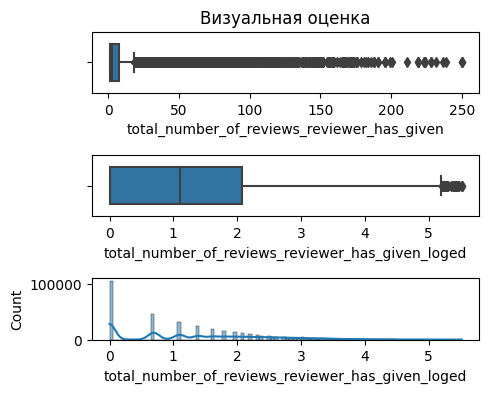

In [50]:
fig, axes = plt.subplots(figsize=(5,4), nrows=3, ncols=1)
sns.boxplot(
    data=hotels,
    x='total_number_of_reviews_reviewer_has_given',
    ax=axes[0],
    width=0.6
)
loged = pd.DataFrame(
    hotels['total_number_of_reviews_reviewer_has_given'].apply(
        lambda x: np.log(x) if x!=0 else np.log(x+1)
    )
)
loged.columns = ['total_number_of_reviews_reviewer_has_given_loged']
sns.boxplot(
    data=loged,
    x='total_number_of_reviews_reviewer_has_given_loged',
    ax=axes[1],
    width=0.6
)
sns.histplot(
    data=loged,
    x='total_number_of_reviews_reviewer_has_given_loged',
    ax=axes[2],
    kde=True
)
fig.subplots_adjust(hspace=1)
axes[0].set_title('Визуальная оценка')

Выбросов стало меньше, но всё они сохранились. Данные распределены не нормально. Нормализируем с помощью алгоритма robust.

In [51]:
r_scaler = preprocessing.RobustScaler()
hotels_scaled['total_number_of_reviews_reviewer_has_given'] = \
    r_scaler.fit_transform(loged)

## Креатив
Не совсем понимаю почему, но перевод в категориальный тип дал немного лучший результат нежели шкалирование.

### total_number_of_reviews
0 -- q25 -- median -- q75 -- q75+1.5iqr -- max

In [52]:
px.box(
    x=hotels_scaled['total_number_of_reviews'],
    title='Распределение для total_number_of_reviews'
).update_xaxes(title='Общее количество действительных отзывов об отеле')

In [53]:
score = pd.cut(hotels_scaled['total_number_of_reviews'],
               bins=[0, 1148, 2216, 3611, 7108, np.inf])
d = {x: x for x in range(6)}
hotels_scaled.loc[:, 'total_number_of_reviews'] = score.cat.codes.replace(d)

### additional_number_of_scoring
0 -- q25 -- median -- q75 -- max

In [54]:
px.box(
    x=hotels_scaled['additional_number_of_scoring'],
    title='Распределение для additional_number_of_scoring'
).update_xaxes(title='Количество действительных оценок без проверки')

In [55]:
score = pd.cut(hotels_scaled['additional_number_of_scoring'],
               bins=[0,168, 338, 641,np.inf])
d = {x: x for x in range(5)}
hotels_scaled.loc[:, 'additional_number_of_scoring'] = score.cat.codes.replace(d)

# 6. Отбор признаков
Ну что же мы в одном шаге от построения модели! Осталось дело за малым - отбросить не релевантные, а возможно и некоторые слабо релевантные признаки.

In [74]:
# оставим только численно выраженные признаки
f_selection = hotels_scaled.select_dtypes(exclude='object')

## 6.1 Анализ мультиколлинеарности
Сильно скоррелированные признаки сообщают для модели одну и ту же информацию. Поэтому для обучения не нужно использовать их все. Часть из них необходимо удалить из набора данных.
До очистки с помощью анализа на мультиколлинеарность MAPE составляла 0,10230.

In [75]:
# разобъём наш датафрейм на целевую переменную и все остальные признаки
target = pd.DataFrame(f_selection['reviewer_score']).astype('int')
temp = f_selection.drop(columns='reviewer_score')

In [76]:
px.imshow(temp.corr(method='kendall'), width=1200, height=1200,
          title='Кореляция по Кендаллу')

c:\users\gosta\pycharmprojects\education\venv\lib\site-packages\scipy\stats\_stats_py.py:4868: RuntimeWarning:

overflow encountered in longlong_scalars



Получили следующие пары с очень сильной связью(абсолютное значение больше 0.9):
* p_neu -- p_pos -0.93;
* Leisure trip -- Business trip -0.91

Построим спектр моделей(список оставленных признаков):
* p_pos, Leisure trip -- 0.10233
* p_pos, Business trip -- 0.10231
* p_neu, Leisure trip -- 0.10235
* p_neu, Business trip -- 0.10234
* Leisure trip, p_neu, p_pos -- 0.10235
* Business Trip, p_neu, p_pos -- 0.10228

Отсюда мы можем сделать некоторые выводы:
1. Прослеживается прямая зависимость между точностью предсказания и наличием признака "Business trip".
2. Несмотря на очень сильную связь между "p_neu" и "p_pos", удаление любого из них приводит к снижению метрики эффективности.
3. Таким образом, мы можем спокойно избавиться от признака "Leisure trip".

In [77]:
f_selection.drop(columns='Leisure trip', inplace=True)

In [94]:
temp.drop(columns='Leisure trip', inplace=True)

## 6.2 Оценка значимости
 Перед обучением мы можем оценить значимость каждого признака для целевой переменной.

### 6.2.1 Категориальные признаки
Для оценки значимости категориальных переменных будем использовать непараметрический тест хи-квадрат `sklearn.feature_selection.chi2`.

Составим список всех кат. признаков.

In [78]:
# напомним себе ещё раз содержимое датафрейма
display(temp.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351485 entries, 0 to 351484
Data columns (total 54 columns):
 #   Column                                      Non-Null Count   Dtype   
---  ------                                      --------------   -----   
 0   additional_number_of_scoring                351485 non-null  int8    
 1   average_score                               351485 non-null  float64 
 2   reviewer_nationality                        351485 non-null  category
 3   review_total_negative_word_counts           351485 non-null  float64 
 4   total_number_of_reviews                     351485 non-null  int8    
 5   review_total_positive_word_counts           351485 non-null  float64 
 6   total_number_of_reviews_reviewer_has_given  351485 non-null  float64 
 7   days_since_review                           351485 non-null  int64   
 8   lat                                         351485 non-null  float64 
 9   lng                                         351485 non-null

None

Таким образом, в него войдут:
* `category` - все;
* `int8` - все;
* `float64` - lat, lng, average_score;
* `int64` - month, year, dayofweek и все из списка tag_list(см. Преобразование признаков/tags) кроме Leisure trip.

In [98]:
cat_cols = f_selection.select_dtypes(include=['category', 'int8']).columns\
    .to_list()
cat_cols.extend(['lat', 'average_score', 'month', 'year', 'dayofweek'])
cat_cols.extend([x for x in tag_list if x != 'Leisure trip'])

Text(0.5, 0.98, 'Значимость категориальных переменных')

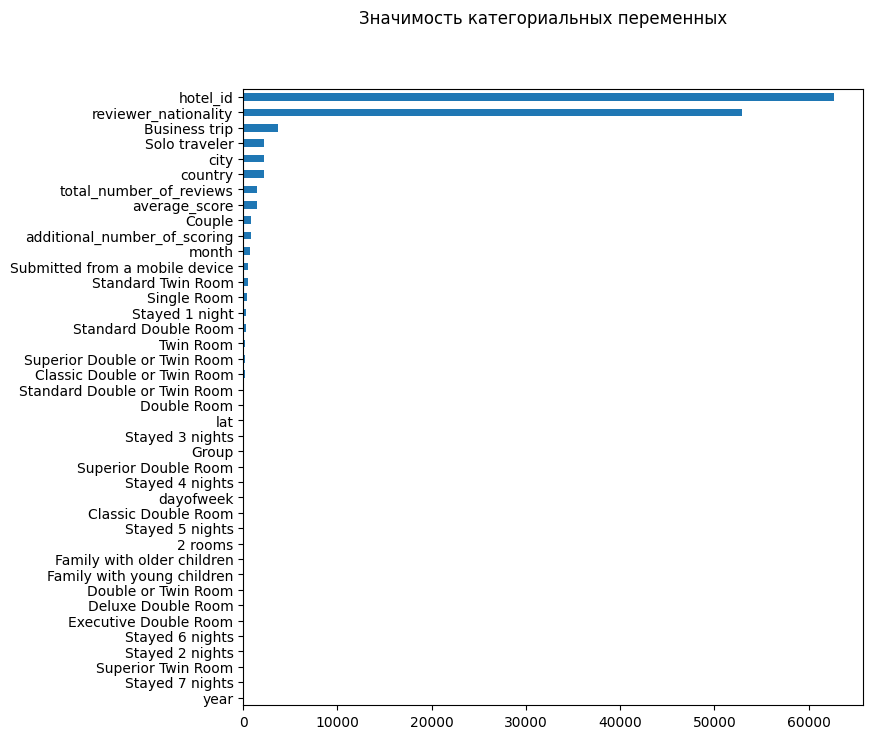

In [99]:
imp_cat = pd.Series(chi2(f_selection[cat_cols], target)[0], index=cat_cols)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind='barh', figsize=(8, 8))
pylab.suptitle('Значимость категориальных переменных')

Даже при удалении наименее значимого признака year, точность упала до 0.10230.
Вывод - оставляем как есть.

### 6.2.2 Непрерывные признаки
Для оценки значимости непрерывных переменных будем использовать функцию `f_classif` из библиотеки sklearn.

Составим список признаков(очевидно, что в него войдут все оставшиеся колонки датафрейма).

Text(0.5, 0.98, 'Значимость непрерывных переменных')

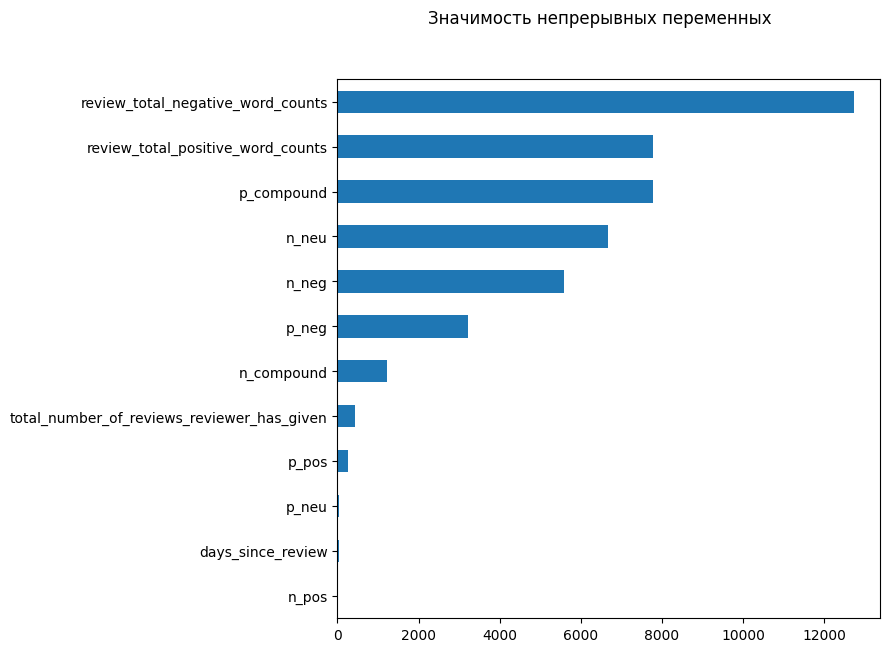

In [103]:
num_cols = [x for x in temp.columns if x not in cat_cols + ['lng']]
imp_num = pd.Series(f_classif(f_selection[num_cols], target.iloc[:, 0])[0],
                    index=num_cols)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh', figsize=(7, 7))
pylab.suptitle('Значимость непрерывных переменных')

При удалении наименее из значимых переменных(n_pos) наблюдается падение точности $=>$ оставляем как есть


In [106]:
# финальный датасет
hotels_f = f_selection.copy()

# 7. Построение модели
Согласно условию мы должны использовать алгоритм "random forest" для предсказания значения reviewer_score, представленный в библиотеке "sklearn" как `RandomForestRegressor` со следующим параметрами:
* n_estimators = 100;
* verbose = 1;
* n_jobs = -1;
* random_state = 42;
* остальные - по умолчанию.

## 7.1 Финальная подготовка данных
Перед тем как запустить обучение модели нам необходимо сделать следующее:
* разбить датасет на обучающую и проверочную части(75% и 25% общих данных соответственно),
* выделить целевую переменную(параметр, который, собственно говоря, мы и будем пытаться предсказывать).

In [107]:
# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели
y = hotels_f['reviewer_score'] # - целевая переменная (рейтинги отелей)
# x - данные с информацией об отелях
x = hotels_f.drop(['reviewer_score'], axis = 1)
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.
# Для тестирования мы будем использовать 25% от исходного датасета.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25,
                                                    random_state=42)

## 7.2 Обучение модели

In [108]:
# Создаём модель
regr = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1,
                             random_state=42)
# Обучаем модель на тестовом наборе данных  
regr.fit(x_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.5s finished


RandomForestRegressor(n_jobs=-1, random_state=42, verbose=1)

## 7.3 Оценка качества модели
Для оценки качества модели — точности прогнозов, сделанных моделью, — мы будем использовать метрику MAPE (mean absolute percentage error), средняя абсолютная процентная ошибка. Эту метрику очень легко интерпретировать. Если у нас MAPE = 11.4 %, то это говорит о том, что ошибка составила 11.4 % от фактических значений.

In [109]:
# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.
y_pred = regr.predict(x_test)
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.
mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
print(f'MAPE: {round(mape, 5)}')

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s


MAPE: 0.10232


[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.5s finished


## 7.4 Оценка важности признаков в построенной модели
Для установления важности признаков воспользуемся атрибутом построенной модели `feature_importances_`.

Text(0.5, 0.98, 'Топ-20 признаков по важности')

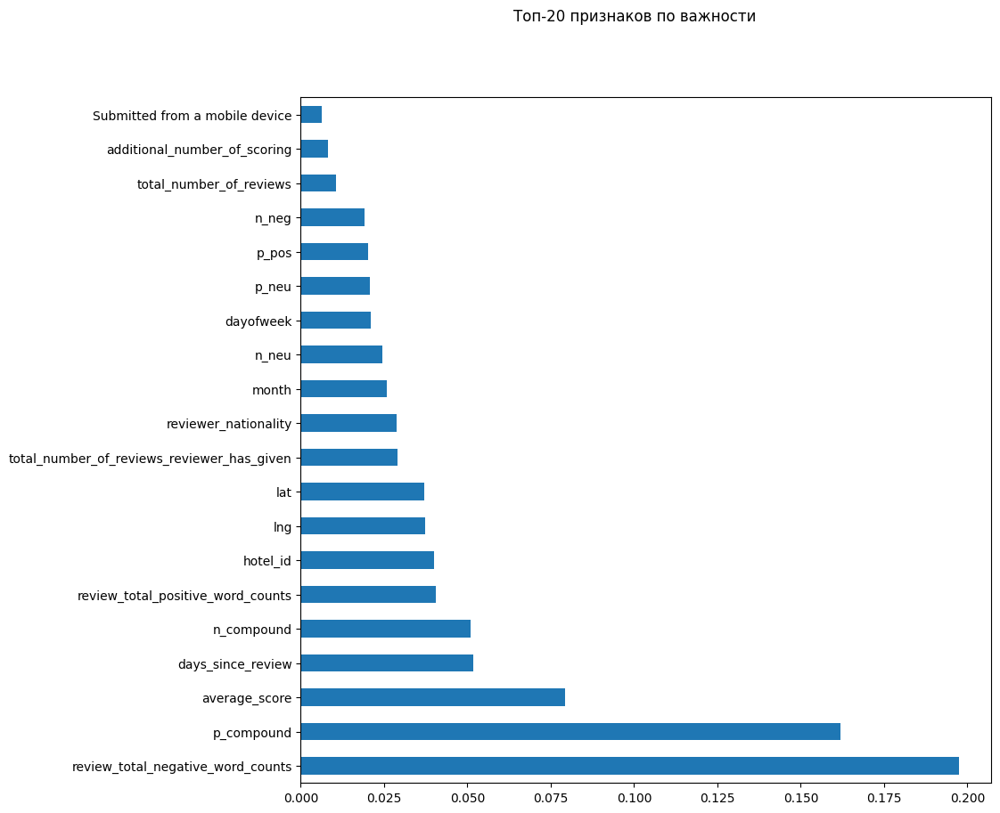

In [110]:
# Вывод самых важных признаков для модели.
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(regr.feature_importances_, index=x.columns)
feat_importances.nlargest(20).plot(kind='barh')
pylab.suptitle('Топ-20 признаков по важности')